In [1]:
library('ggplot2')
library('reshape2')
library('ggpubr')
library(glmnet)
library(doMC)
library(survival)
library(data.table)
library(mltools)
library(CoxBoost)
library(randomForestSRC)
library(CoxHD)
library(Hmisc)
library(gridExtra)
library("survminer")
source("../../../src/tools.R")
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 250, # set the maximum number of rows displayed
        repr.matrix.max.cols = 250) # set the maximum number of columns displayed

Loading required package: magrittr
Loading required package: Matrix
Loading required package: foreach
Loaded glmnet 2.0-16

Loading required package: iterators
Loading required package: parallel

Attaching package: ‘data.table’

The following objects are masked from ‘package:reshape2’:

    dcast, melt

Loading required package: prodlim

 randomForestSRC 2.9.0 
 
 Type rfsrc.news() to see new features, changes, and bug fixes. 
 

Loading required package: RColorBrewer
Loading required package: lattice
Loading required package: Formula

Attaching package: ‘Hmisc’

The following object is masked from ‘package:randomForestSRC’:

    impute

The following objects are masked from ‘package:base’:

    format.pval, units



In [77]:
x <- data.matrix(df_final)
y <- data.matrix(df_final[,c("os","os_status")])

colnames(y) = c("time","status")
response=y
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=3, importance="TRUE",nodesize=2)
    
         #           # Predict
                   risk.predict = predict(cvfit, data.frame(vTest), importance="TRUE")$predicted
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   #return (as.vector(ci.test$concordance))
                   #return(list(as.matrix(cvfit$importance),as.vector(ci.test$concordance)))
                   return(cvfit)## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=1
               )

[1] "start CV"
..........

SVM is used as an intermediary because it comes from python and then it is integrated to each feature usage datasets.

In [2]:
#val_dl= c(0.7774745123223891,0.7838805490888657,0.7704904872762303,0.774985951673757,0.7695913943967247,0.7710042546359477,0.771132696475877,
#         0.7696395600866982,0.762045436300875,0.7690455165770249)
#w <- data.frame(model=rep('all_features',10),variable=rep("deep neural network",10),value=val_dl)
#write.table(w,"final_prognosis/neural_network_all_features.tsv",sep='\t')

In [3]:
SVM <- read.table("final_prognosis/SVM_comp.csv",sep=',',header=T)

list_models <- list.files('final_prognosis')[list.files('final_prognosis')!="SVM_comp.csv" & list.files('final_prognosis')!="age.tsv"
                                            & list.files('final_prognosis')!="neural_network_all_features.tsv"]
df_w_all <-NULL
for (l in list_models){
  tmp <- cbind(read.table(paste("final_prognosis",l,sep="/")),SVM_optimized=SVM[,substr(l,1,nchar(l)-4)])    
  tmp$model <- substr(l,1,nchar(l)-4)
  
  assign(substr(l,1,nchar(l)-4),melt(tmp,id='model')) 
  df_w_all <- rbind(df_w_all,get(substr(l,1,nchar(l)-4)))
}
## add dl
#w <- data.frame(model=rep('all_features',10),variable=rep("deep neural network",10),value=val_dl)
df_w_all <- rbind(read.table("final_prognosis/neural_network_all_features.tsv"),df_w_all)
colnames(df_w_all) <- c('model','algorithm','CI_test')
model_medians<-c()
df_w_all$model<-factor(df_w_all$model,levels=substr(list_models,1,nchar(list_models)-4))
for( model in levels(df_w_all$model)){

   model_medians <- c(model_medians,median(df_w_all$CI_test[df_w_all$model==as.character(model)],na.rm=T))
}
model_medians<-data.frame(model=levels(df_w_all$model),Z=model_medians)

In [4]:
###### Preparation worst and best

In [5]:
tmp_top <- model_medians[order(model_medians$Z,decreasing=T),]
top <- tmp_top[tmp_top$Z>0.699,]
tmp_worst <- model_medians[order(model_medians$Z),]
worst <- tmp_worst[tmp_worst$Z<0.64,]
df_w_top <- df_w_all[is.element(df_w_all$model,unique(top$model)),]
df_w_worst <- df_w_all[is.element(df_w_all$model,unique(worst$model)),]

##### Conclusion: Clinical and demographical are the more important features for the prognosis models.
##### The eln is also an important parameter because it is solo and it definitely imporves prognosis

##### Of course adding genetical and cytogenetical data slightly improve the overallsurvival prognosis.
##### Adding genetical information or cytogenetical information of component information has the same effect on prognosis when we have clinical and demographical features used for evaluation.

In [ ]:
df_w_all

# ALL MODELS

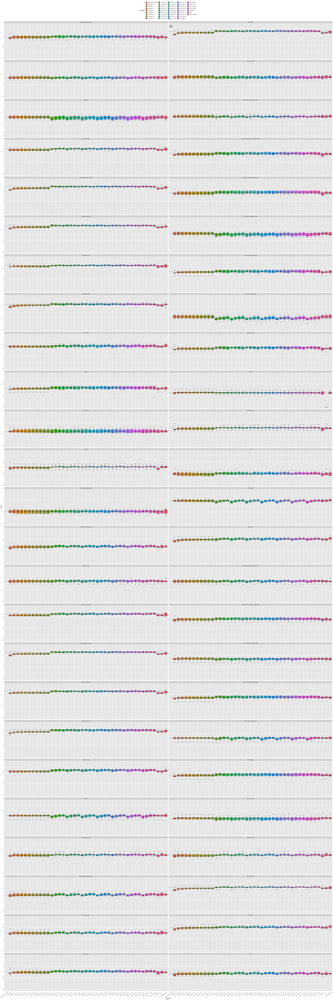

In [51]:
set_notebook_plot_size(40,120)
ggplot(df_w_all,aes(x=algorithm,y=CI_test)) +
    geom_boxplot(aes(fill = algorithm), notch=F)+
    #scale_fill_manual(values = c('#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69'))+
    facet_wrap( ~ model, ncol=2) +
    geom_hline(data = model_medians, aes(yintercept = Z), linetype = 2)+
    theme(legend.position="top",axis.text.x = element_text(angle = 35, hjust = 0.8,vjust=0.8)) 

# TOP MODELS >0.7

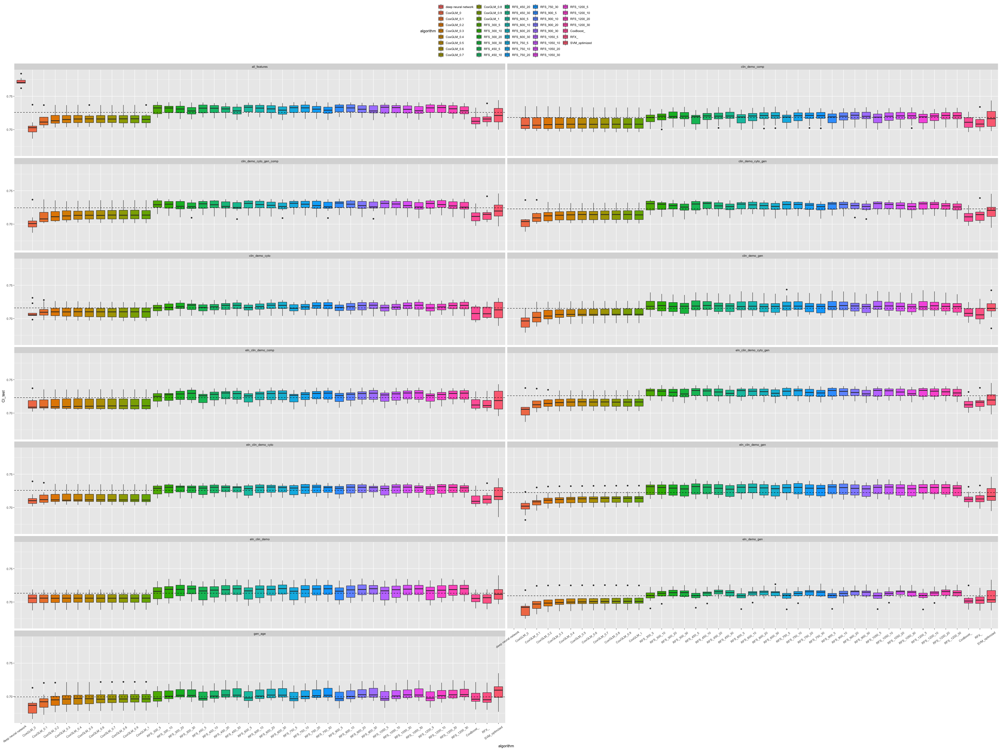

In [7]:
set_notebook_plot_size(40,30)
ggplot(df_w_top,aes(x=algorithm,y=CI_test)) +
    geom_boxplot(aes(fill = algorithm), notch=F)+
    #scale_fill_manual(values = c('#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69'))+
    facet_wrap( ~ model, ncol=2) +
    geom_hline(data = top, aes(yintercept = Z), linetype = 2)+
    theme(legend.position="top",axis.text.x = element_text(angle = 35, hjust = 0.8,vjust=0.8)) 

### For the good models, we have a trend and RFD do better than others (lots of features).
######This might be explained by the fact that the GLM Models are not able to perform feature selection if there are too many features.

# WORST MODELS <0.64

Warning message:
“Removed 766 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (geom_hline).”

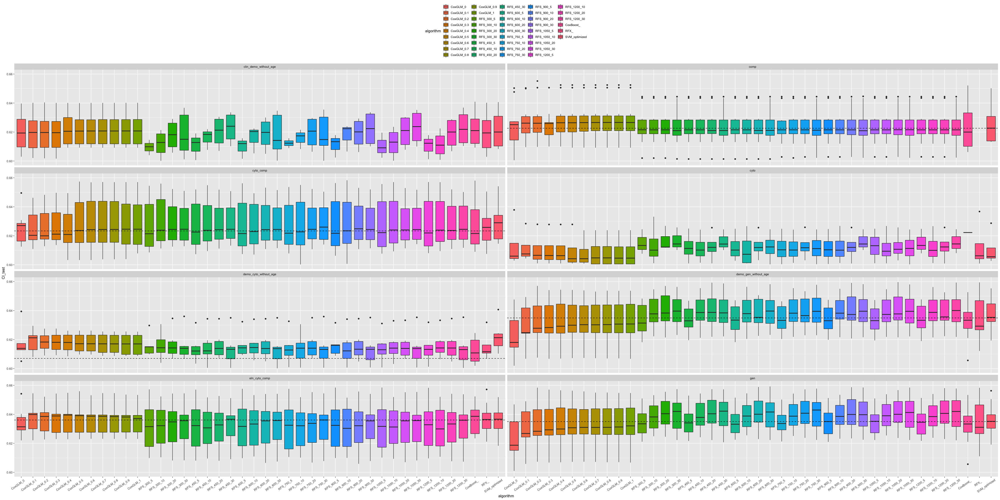

In [8]:
set_notebook_plot_size(40,20)
ggplot(df_w_worst,aes(x=algorithm,y=CI_test)) +
    geom_boxplot(aes(fill = algorithm), notch=F)+
    #scale_fill_manual(values = c('#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69'))+
    facet_wrap( ~ model, ncol=2) +
    geom_hline(data = worst, aes(yintercept = Z), linetype = 2)+
    theme(legend.position="top",axis.text.x = element_text(angle = 35, hjust = 0.8,vjust=0.8)) +ylim(0.6,0.66)

### We prove it when we look at the worse models :
GLM perform better than RFS

### Model and Algorithms Performance visualization 

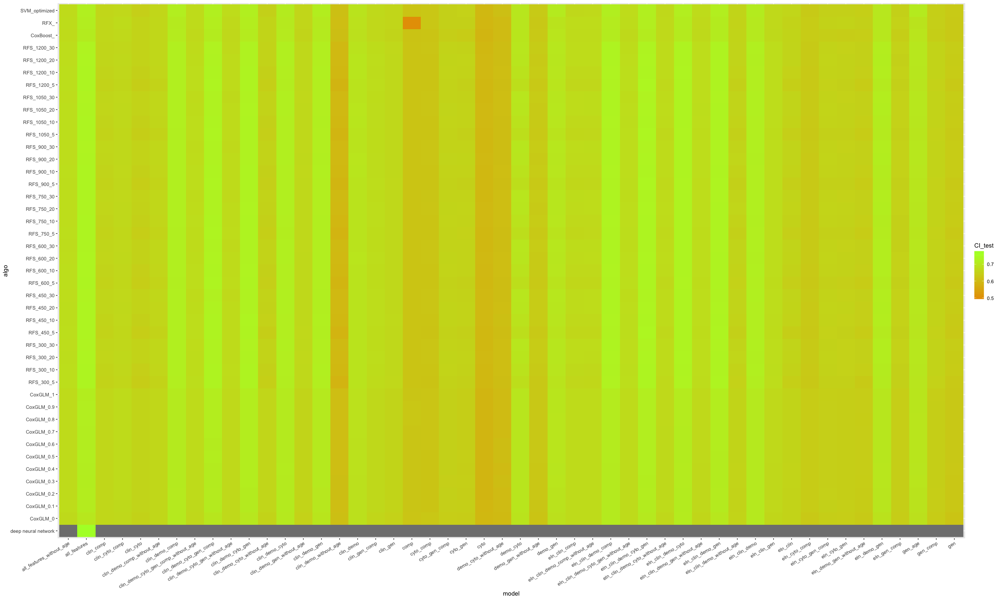

In [9]:
set_notebook_plot_size(25,15)
#nrow = number of prognosis models 
#ncol = number of feature models
table_res <- as.data.frame(matrix(0,nrow =length(unique(df_w_all$algorithm)), ncol=length(model_medians$model)))
colnames(table_res)<-levels(df_w_all$model)
rownames(table_res)<-levels(df_w_all$algorithm)

for(model in colnames(table_res)){
    for(algo in rownames(table_res)){
        table_res[algo,model]<-median(df_w_all$CI_test[df_w_all$model==model & df_w_all$algorithm==algo])
    }
}
row_names <-rownames(table_res)
table_res$algo<-rownames(table_res)
rownames(table_res)<-NULL
table_res<-melt(table_res,id='algo')
colnames(table_res)<-c('algo','model','CI_test')
table_res$algo<-factor(table_res$algo,levels=row_names)
table_res$model<-factor(table_res$model)
ggplot(table_res, aes(model, algo)) +

    # geom raster heatmap
    geom_raster(aes(fill = CI_test), show.legend = TRUE) +
    scale_fill_gradient(low="#e79f00", high="greenyellow") +
    tilt_x_label(30) 

# Model Performance Evaluation

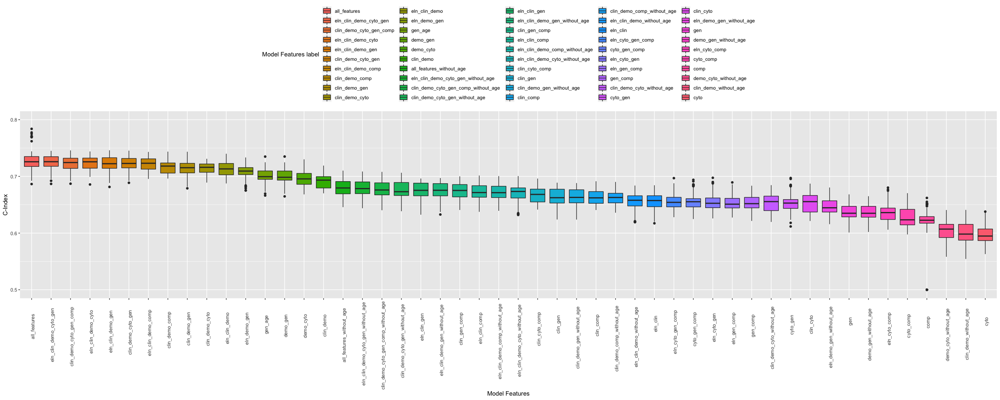

In [10]:
set_notebook_plot_size(25,10)
ggplot(df_w_all, aes(x=reorder(model, -CI_test),y=CI_test))+
geom_boxplot(aes(fill =reorder(model, -CI_test)), notch=F)+
theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+ylim(0.50,0.8)+xlab("Model Features")+ylab("C-Index")+labs(fill = " Model Features label")

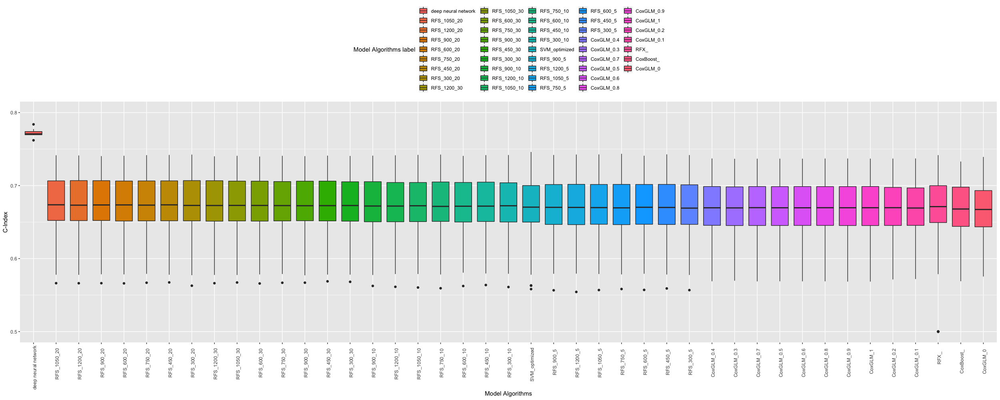

In [11]:
set_notebook_plot_size(25,10)
ggplot(df_w_all, aes(x=reorder(algorithm, -CI_test),y=CI_test))+
geom_boxplot(aes(fill =reorder(algorithm, -CI_test)), notch=F)+
theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+ylim(0.5,0.8)+xlab("Model Algorithms")+ylab("C-Index")+labs(fill = " Model Algorithms label")

# Evaluation of feature importance for different models 

In [12]:
df_final <- read.table("prognosis_comp_final.tsv",sep='\t',header=T)
### Features that we can use
###-----------------------------------------------------------------------------
all_features <-c(1:180) #not used
clin_demo_comp <-c(155:180) #not used
clin_demo_cyto_gen_comp <- c(2:180) #not used
comp <- c(164:180) #not used
cyto_comp <-c(86:154,164:180) #not used
cyto_gen_comp <- c(2:154,164:180) #not used
eln_clin_demo_comp <- c(1,155:180) #not used
eln_cyto_comp <- c(1,86:154,164:180) #not used
eln_cyto_gen_comp <- c(1:154,164:180) #not used
eln_gen_comp <- c(1:85,164:180) #not used
gen_comp <- c(2:85,164:180) #not used
clin_comp <- c(155:161,164:180) #not used
clin_cyto_comp <- c(86:161,164:180) #not used
clin_gen_comp <- c(2:85,155:161,164:180) #not used
eln_clin_comp <- c(1,155:161,164:180) #not used
age <- c(163)
gen_age <- c(2:85,163)
eln_clin_gen <-  c(1:85,155:161)
eln_demo_gen <- c(1:85,162:163)
eln_clin_demo_cyto_gen <- c(1:163)
eln_clin_demo_cyto <- c(1,86:163)
eln_clin_demo_gen <- c(1:85,155:163)  ##START HERE
eln_clin_demo <- c(1,155:163)
eln_clin <- c(1,155:161)
eln_cyto_gen <- c(1:154)
clin_demo_cyto_gen <- c(2:163)
clin_demo_cyto <- c(86:163)
clin_demo_gen <- c(2:85,155:163)
clin_demo <- c(155:163)
cyto_gen <- c(2:154)
cyto <- c(86:154)
gen <- c(2:85)
clin_gen <- c(2:85,155:161)
clin_cyto <- c(86:161)
demo_gen <- c(2:85,162:163)
demo_cyto <- c(86:154,162:163)  

###Without age:
all_features_without_age <-c(1:162,164:180) #not used
clin_demo_comp_without_age <-c(155:162,164:180) #not used
clin_demo_cyto_gen_comp_without_age <- c(2:162,164:180) #not used
eln_clin_demo_comp_without_age <- c(1,155:162,164:180) #not used
eln_demo_gen_without_age <- c(1:85,162)
eln_clin_demo_cyto_gen_without_age <- c(1:162)
eln_clin_demo_cyto_without_age <- c(1,86:162)
eln_clin_demo_gen_without_age <- c(1:85,155:162)
eln_clin_demo_without_age <- c(1,155:162)
clin_demo_cyto_gen_without_age <- c(2:162)
clin_demo_cyto_without_age <- c(86:162)
clin_demo_gen_without_age <- c(2:85,155:162)
clin_demo_without_age <- c(155:162)
demo_gen_without_age <- c(2:85,162)
demo_cyto_without_age <- c(86:154,162)   

###
###-----------------------------------------------------------------------------

x <- data.matrix(df_final)
y <- data.matrix(df_final[,c("os","os_status")])

colnames(y) = c("time","status")
response=y
design=x[,all_features]
nrepeats=2
nfolds=5
set.seed(17)
# Make folds

n = nrow(design)
folds <- list()
for (i in seq(nrepeats)) {
    folds <- c(folds,split(sample(seq(n)), rep(1:nfolds, length = n)))
}
nexp = length(folds) # the total number CV of experiments


# I- Cox Models with Penalization

In [13]:
#res.cox <- coxph(Surv(os, os_status) ~ demo_gen_without_age,data=df_final)
f1 <- as.formula(paste("Surv(os, os_status) ~ ",
                       paste(colnames(df_final[,eln_clin]), collapse= "+")))

Warning message in fitter(X, Y, strats, offset, init, control, weights = weights, :
“Loglik converged before variable  19,61,103,104,107,134,136,142 ; coefficient may be infinite. ”Warning message in cor(xx, r2):
“the standard deviation is zero”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 1236 rows containing missing values (geom_point).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 1236 rows containing missing values (geom_point).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 1236 rows containing missing values (geom_point).”Warning message:

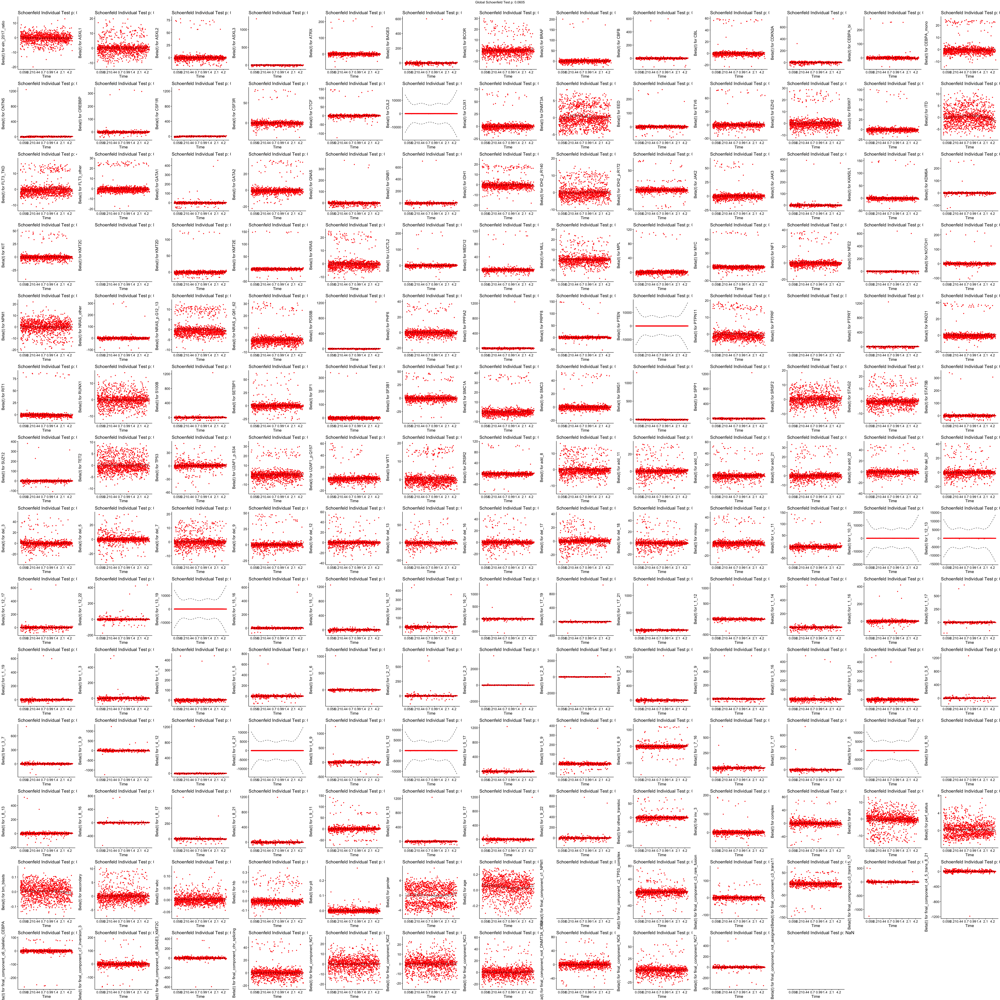

In [14]:
set_notebook_plot_size(50,50)
f1 <- as.formula(paste("Surv(os, os_status) ~ ",
                       paste(colnames(df_final[,all_features]), collapse= "+")))
res.cox <- coxph(f1,data=df_final)
test.ph <- cox.zph(res.cox)
#test.ph
ggcoxzph(test.ph)
#ggcoxdiagnostics(res.cox, type = "deviance",
#                 linear.predictions = FALSE, ggtheme = theme_bw())
#ggcoxfunctional(Surv(os, os_status) ~ age + log(age) + sqrt(age), data = df_final)


[1] "start CV"


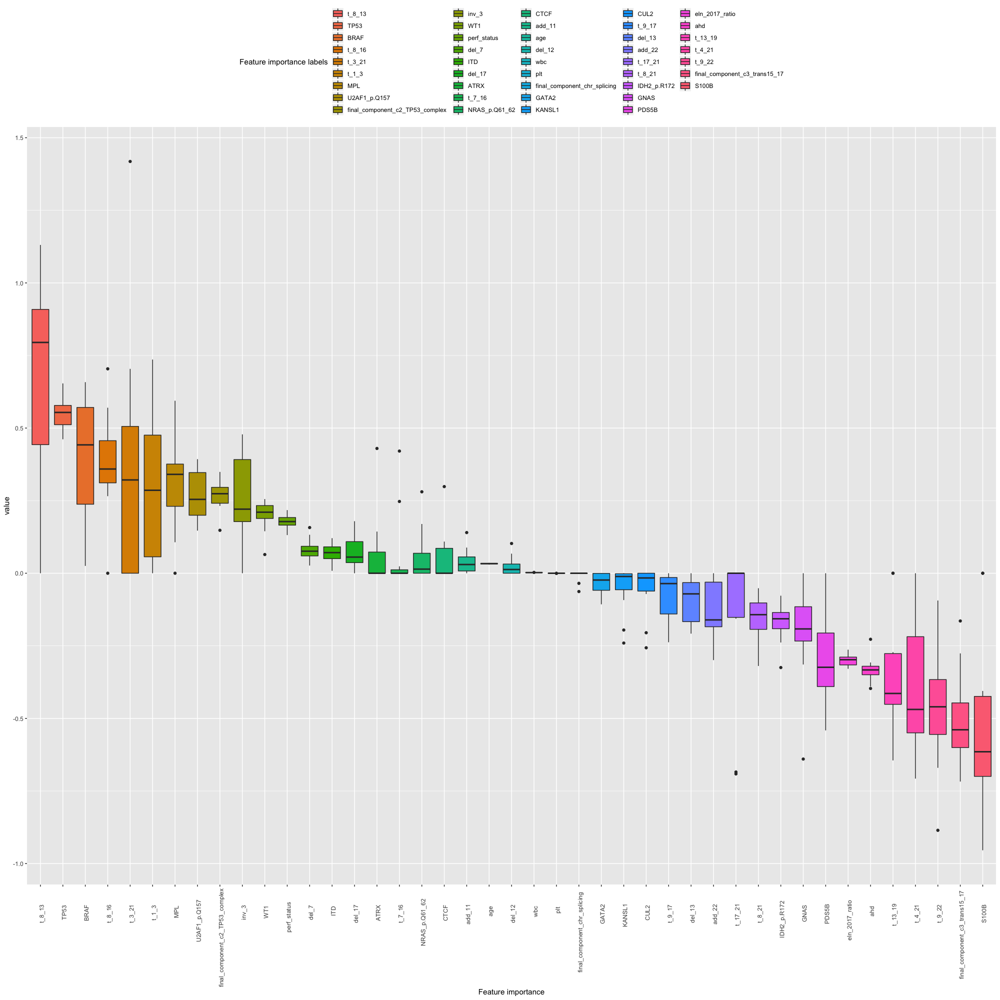

In [15]:
# Chose features you want with design
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.5, nfolds=10, grouped=TRUE,standardize=T)
                   risk.predict = predict(cvfit, newx=vTest, s="lambda.min", type="response")
                   risk.predict = as.vector(risk.predict[,1])
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   return(list(as.matrix(coef(cvfit,s="lambda.min")),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=10
               )
### rescv returns a list with 25 dataframes with the coefficient of each variables for the model cross validated fitted model and 25 concordance indices on the testings set used . We do the boxplots of the variable
### importance to have an exhaustive view over the same algorithm trained differently.
cox_results <- rescv[[1]][[1]]
colnames(cox_results)[1] <- "exp_1"
for (i in 2:length(rescv)){
    cox_results  <-cbind(cox_results ,rescv[[i]][[1]])
    colnames(cox_results)[i] <- paste("exp",i,sep="_")
}
cox_results  <-as.data.frame(cox_results )
cox_results$median <- apply(cox_results ,1, median, na.rm = TRUE)
cox_results$features <-rownames(cox_results)
cox_results <- cox_results[(apply(cox_results[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0) & (apply(cox_results[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0),]
cox_results <-melt(cox_results,id='features')
colnames(cox_results) <- c('features','exp','value')
set_notebook_plot_size(20,20)
ggplot(cox_results,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")

[1] "start CV"


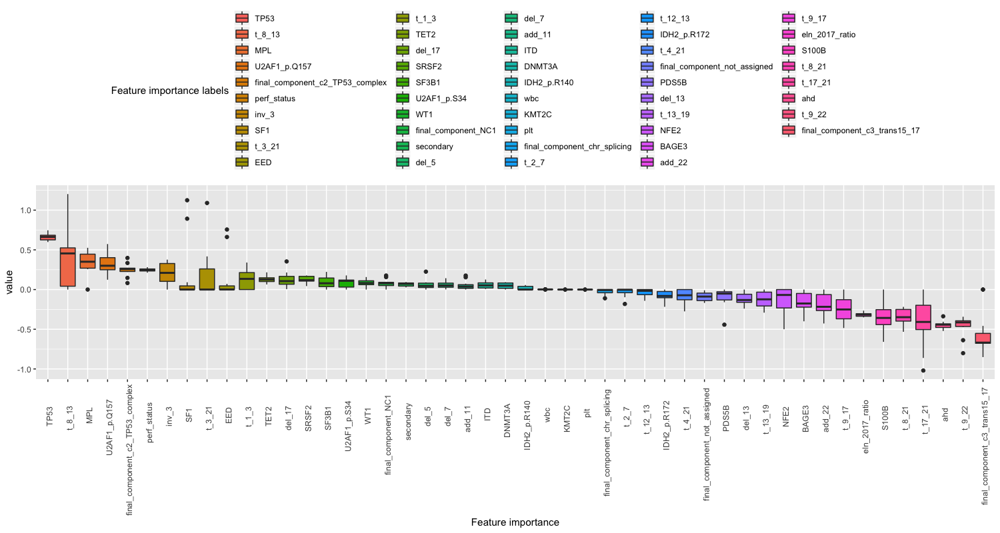

In [16]:
# WITHOUT AGE             THE ALGO WILL SELECT MUCH MORE FEATURES
design=x[,all_features_without_age]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=1, nfolds=10, grouped=TRUE)
                   risk.predict = predict(cvfit, newx=vTest, s="lambda.min", type="response")
                   risk.predict = as.vector(risk.predict[,1])
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   return(list(as.matrix(coef(cvfit,s="lambda.min")),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=25
               )
### rescv returns a list with 25 dataframes with the coefficient of each variables for the model cross validated fitted model and 25 concordance indices on the testings set used . We do the boxplots of the variable
### importance to have an exhaustive view over the same algorithm trained differently.
cox_results_without_age <- rescv[[1]][[1]]
colnames(cox_results_without_age)[1] <- "exp_1"
for (i in 2:length(rescv)){
    cox_results_without_age  <-cbind(cox_results_without_age ,rescv[[i]][[1]])
    colnames(cox_results_without_age)[i] <- paste("exp",i,sep="_")
}
cox_results_without_age  <-as.data.frame(cox_results_without_age )
cox_results_without_age$median <- apply(cox_results_without_age ,1, median, na.rm = TRUE)
cox_results_without_age$features <-rownames(cox_results_without_age)
cox_results_without_age <- cox_results_without_age[(apply(cox_results_without_age[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0) & (apply(cox_results_without_age[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0),]
cox_results_without_age <-melt(cox_results_without_age,id='features')
colnames(cox_results_without_age) <- c('features','exp','value')
set_notebook_plot_size(15,8)
ggplot(cox_results_without_age,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")

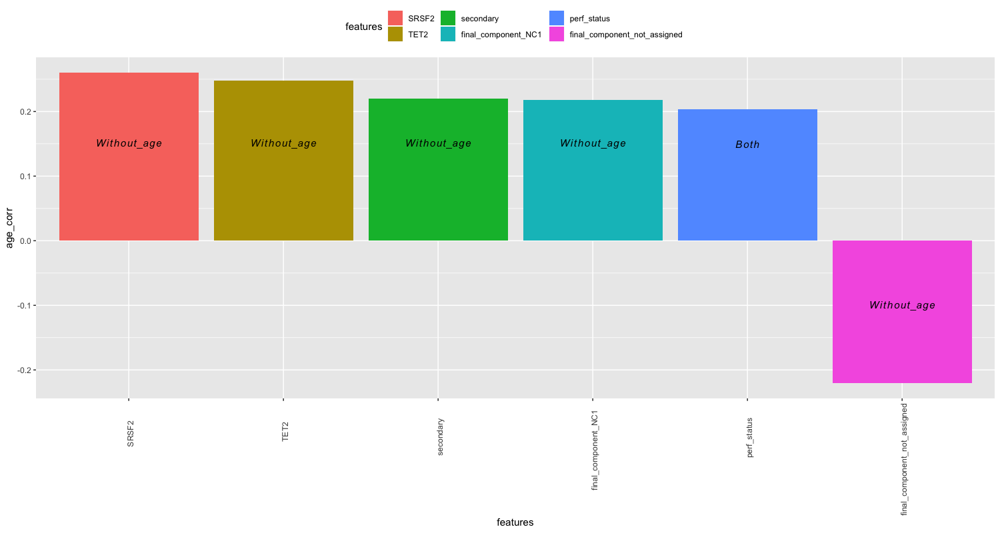

In [17]:
age <- data.frame(data.frame(rcorr(as.matrix(df_final[,all_features]),type='pearson')$r)$age,row.names=rownames(data.frame(rcorr(as.matrix(df_final[,all_features]))$r)))
colnames(age) <- "age_corr"
age$features <- rownames(age)
age <- age[age$age_corr>0.2 | age$age_corr< -0.2,]
age <- age[order(age$age_corr,decreasing=T),]
age$features <- factor(age$features, levels = age$features)
ggplot(age[age$features!="age",],aes(x=features,y=age_corr))+geom_bar(stat = "identity", aes(fill = features))+
theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+
annotate("text", x = c(1,2,3,4,6), y = c(rep(0.15,4),-0.1), label = "italic(Without_age)",parse=TRUE)+
annotate("text", x = c(5), y = c(0.15), label = "italic(Both)",parse=TRUE)

In [18]:
# Check elements that intersect : they all appear with secondary and perf status in the common
# This means that the GLM without age tend to select features correlated with age. This is in concordance with the goal of the model which is to perform feature selection and basically keep features not correlated that is why when age is removed we have to keep those features whereas it is the contrary when age is here.
with_age <- unique(cox_results$features)
without_age <- unique(cox_results_without_age$features)
common <- intersect(with_age,without_age)
with_age_only <- with_age[!(with_age %in% without_age)]
without_age_only <-  without_age[!(without_age %in% with_age )]
#without_age_only
#common

# II- Random Forest Variable Importance

In [ ]:
# Chose features you want with design
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1050, importance="TRUE",nodesize=20)
    
                    # Predict
                   risk.predict = predict(cvfit, data.frame(vTest), importance="TRUE")$predicted
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   #return (as.vector(ci.test$concordance))
                   return(list(as.matrix(cvfit$importance),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=50
               )
rf_results <- rescv[[1]][[1]]
colnames(rf_results)[1] <- "exp_1"
for (i in 2:length(rescv)){
    rf_results <-cbind(rf_results,rescv[[i]][[1]])
    colnames(rf_results)[i] <- paste("exp",i,sep="_")
}
rf_results <-as.data.frame(rf_results)
rf_results$median <- apply(rf_results,1, median, na.rm = TRUE)
rf_results$features <-rownames(rf_results)
rf_results <- rf_results[(apply(rf_results[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0) & (apply(rf_results[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0),]
rf_results <-melt(rf_results,id='features')
colnames(rf_results) <- c('features','exp','value')


In [ ]:
# RFS without age

design <- x[,all_features_without_age]
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1200, importance="TRUE",nodesize=30)
    
                    # Predict
                   risk.predict = predict(cvfit, data.frame(vTest), importance="TRUE")$predicted
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   #return (as.vector(ci.test$concordance))
                   return(list(as.matrix(cvfit$importance),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=25
               )
rfs_results_no_age <- rescv[[1]][[1]]
colnames(rfs_results_no_age)[1] <- "exp_1"
for (i in 2:length(rescv)){
    rfs_results_no_age <-cbind(rfs_results_no_age,rescv[[i]][[1]])
    colnames(rfs_results_no_age)[i] <- paste("exp",i,sep="_")
}
rfs_results_no_age <-as.data.frame(rfs_results_no_age)
rfs_results_no_age$median <- apply(rfs_results_no_age,1, median, na.rm = TRUE)
rfs_results_no_age$features <-rownames(rfs_results_no_age)
rfs_results_no_age <- rfs_results_no_age[apply(rfs_results_no_age[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0 & apply(rfs_results_no_age[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0,]
rfs_results_no_age <-melt(rfs_results_no_age,id='features')
colnames(rfs_results_no_age) <- c('features','exp','value')


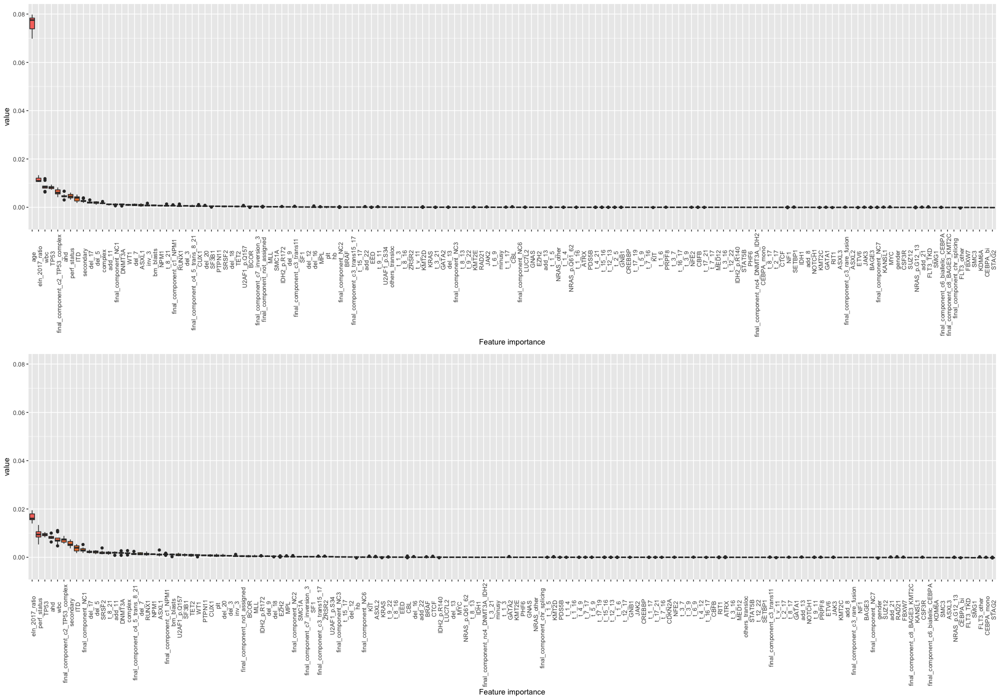

In [45]:
set_notebook_plot_size(20,14)
p1 <- ggplot(rf_results,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels") +ylim(-0.005,0.08)
p2 <- ggplot(rfs_results_no_age,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels") +ylim(-0.005,0.08)
grid.arrange(p1,p2,nrow=2)

In [90]:
w <- data.frame(rf_results)
w$row <- rownames(w)
w[w$row=="eln_2017_ratio",]

,rf_results,row
eln_2017_ratio,0.02679855,eln_2017_ratio


# FEW OTHER RF 

[1] "start CV"


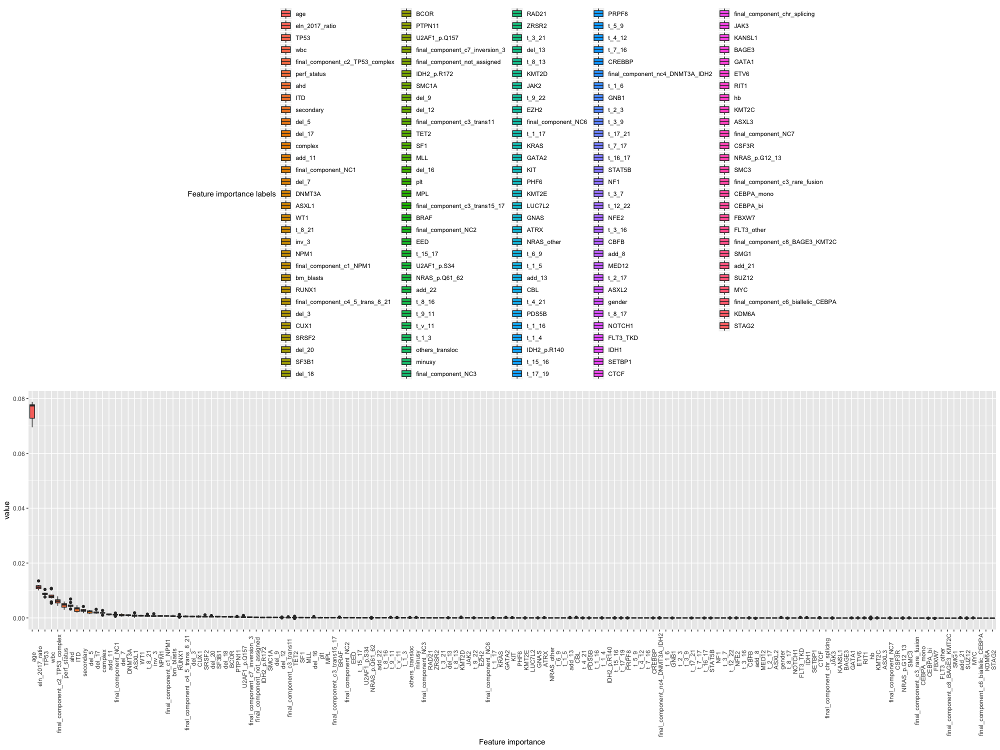

In [23]:
# TRY SOME 1
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1200, importance="TRUE",nodesize=30)
    
                    # Predict
                   risk.predict = predict(cvfit, data.frame(vTest), importance="TRUE")$predicted
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   #return (as.vector(ci.test$concordance))
                   return(list(as.matrix(cvfit$importance),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=50
               )
rf_results1 <- rescv[[1]][[1]]
colnames(rf_results1)[1] <- "exp_1"
for (i in 2:length(rescv)){
    rf_results1 <-cbind(rf_results1,rescv[[i]][[1]])
    colnames(rf_results1)[i] <- paste("exp",i,sep="_")
}
rf_results1 <-as.data.frame(rf_results1)
rf_results1$median <- apply(rf_results1,1, median, na.rm = TRUE)
rf_results1$features <-rownames(rf_results1)
rf_results1 <- rf_results1[(apply(rf_results1[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0) & (apply(rf_results1[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0),]
rf_results1 <-melt(rf_results1,id='features')
colnames(rf_results1) <- c('features','exp','value')
set_notebook_plot_size(20,15)
ggplot(rf_results1,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")

[1] "start CV"


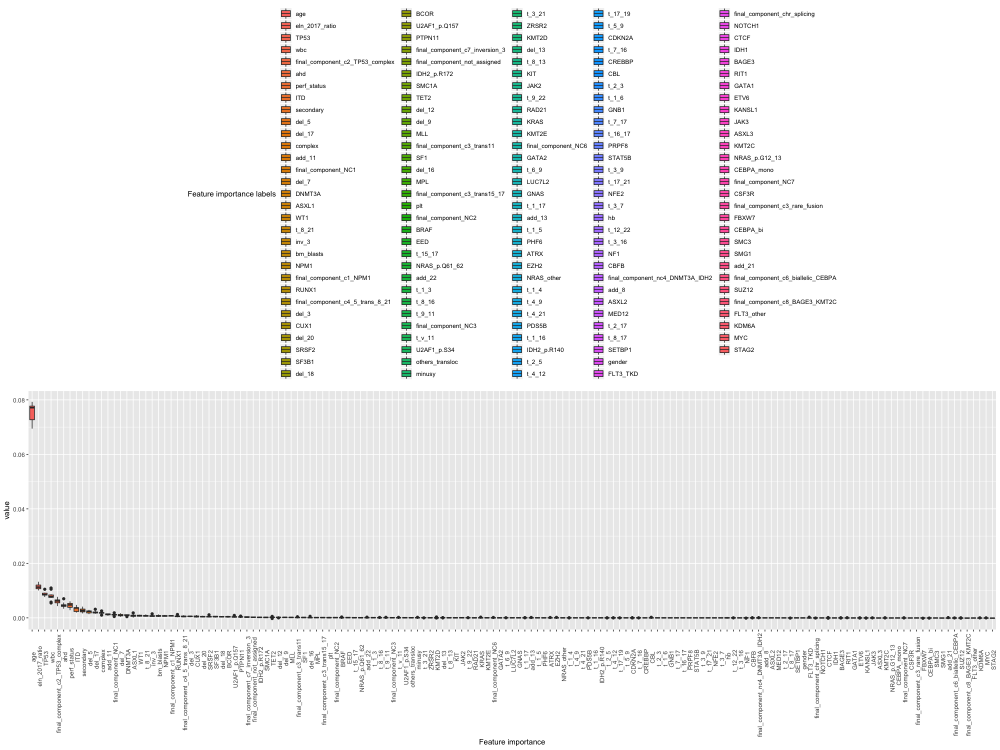

In [24]:
# TRY SOME 2
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1200, importance="TRUE",nodesize=30)
    
                    # Predict
                   risk.predict = predict(cvfit, data.frame(vTest), importance="TRUE")$predicted
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   # Evaluate CI on the test
                   #return(as.vector(coef(cvfit,s="lambda.min")))
                   #return (as.vector(ci.test$concordance))
                   return(list(as.matrix(cvfit$importance),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=50
               )
rf_results2 <- rescv[[1]][[1]]
colnames(rf_results2)[1] <- "exp_1"
for (i in 2:length(rescv)){
    rf_results2 <-cbind(rf_results2,rescv[[i]][[1]])
    colnames(rf_results2)[i] <- paste("exp",i,sep="_")
}
rf_results2 <-as.data.frame(rf_results2)
rf_results2$median <- apply(rf_results2,1, median, na.rm = TRUE)
rf_results2$features <-rownames(rf_results2)
rf_results2 <- rf_results2[(apply(rf_results2[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0) & (apply(rf_results2[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0),]
rf_results2 <-melt(rf_results2,id='features')
colnames(rf_results2) <- c('features','exp','value')
set_notebook_plot_size(20,15)
ggplot(rf_results2,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")

##### Interesting to see that age is selected as the most important feature for the random forest

# III Boosting Feature Importance 

[1] "start CV"


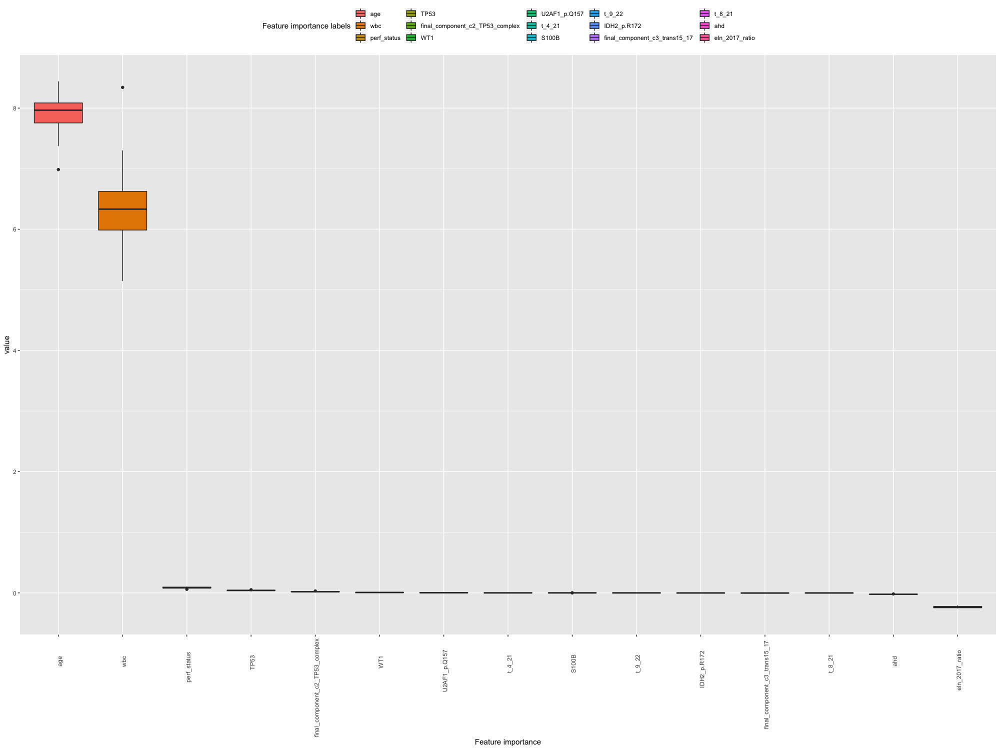

In [26]:
# Chose features you want with design
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   #cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1500, importance="TRUE",nodesize=15)
                   cvfit<-CoxBoost(time=lTrain[,1],status=lTrain[,2],x=vTrain)
                   risk.predict<-as.vector(predict(cvfit,vTest,newtime=lTest[,1],newstatus=lTest[,2],type='lp'))
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   return(list(as.matrix(coefficients(cvfit)),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=25
               )
### rescv returns a list with 25 dataframes with the coefficient of each variables for the model cross validated fitted model and 25 concordance indices on the testings set used . We do the boxplots of the variable
### importance to have an exhaustive view over the same algorithm trained differently.
boost_results <- rescv[[1]][[1]]
colnames(boost_results)[1] <- "exp_1"
for (i in 2:length(rescv)){
    boost_results <-cbind(boost_results,rescv[[i]][[1]])
    colnames(boost_results)[i] <- paste("exp",i,sep="_")
}
boost_results <-as.data.frame(boost_results)
boost_results$median <- apply(boost_results,1, median, na.rm = TRUE)
boost_results$features <-rownames(boost_results)
boost_results <- boost_results[apply(boost_results[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0 & apply(boost_results[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0,]
boost_results <-melt(boost_results,id='features')
colnames(boost_results) <- c('features','exp','value')
set_notebook_plot_size(20,15)
ggplot(boost_results,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")

[1] "start CV"


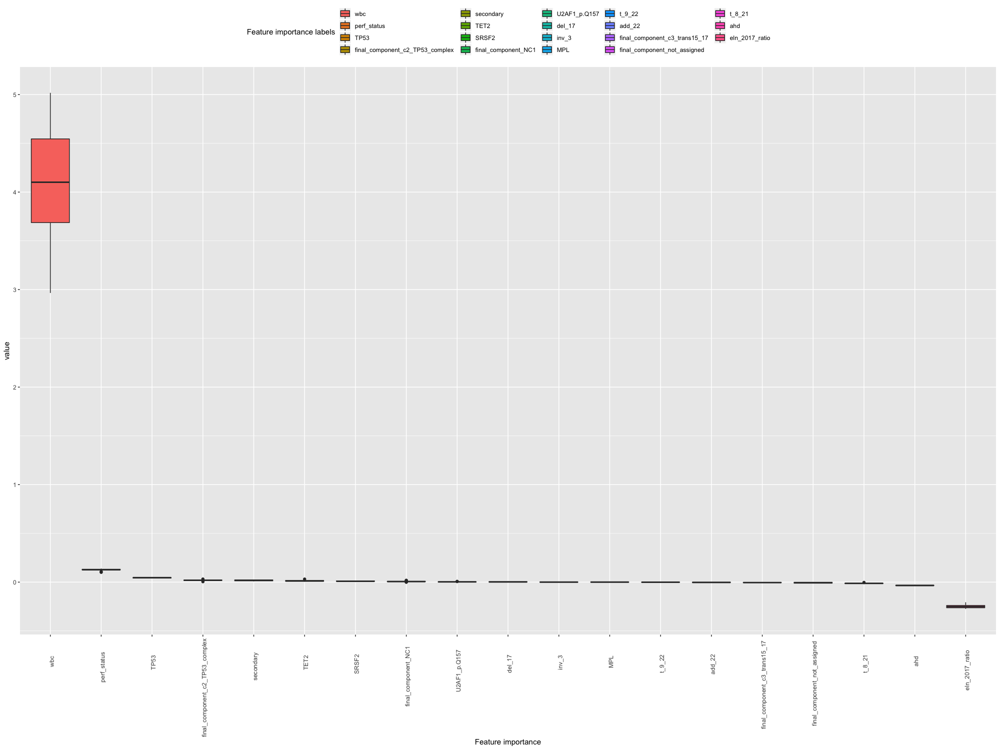

In [27]:
# Boosting without age
x <- data.matrix(df_final)
y <- data.matrix(df_final[,c("os","os_status")])

colnames(y) <- c("time","status")
response <- y
design <- x[,all_features_without_age]

print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   #cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1500, importance="TRUE",nodesize=15)
                   cvfit<-CoxBoost(time=lTrain[,1],status=lTrain[,2],x=vTrain)
                   risk.predict<-as.vector(predict(cvfit,vTest,newtime=lTest[,1],newstatus=lTest[,2],type='lp'))
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   return(list(as.matrix(coefficients(cvfit)),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=25
               )
boost_results_no_age <- rescv[[1]][[1]]
colnames(boost_results_no_age)[1] <- "exp_1"
for (i in 2:length(rescv)){
    boost_results_no_age <-cbind(boost_results_no_age,rescv[[i]][[1]])
    colnames(boost_results_no_age)[i] <- paste("exp",i,sep="_")
}
boost_results_no_age <-as.data.frame(boost_results_no_age)
boost_results_no_age$median <- apply(boost_results_no_age,1, median, na.rm = TRUE)
boost_results_no_age$features <-rownames(boost_results_no_age)
boost_results_no_age <- boost_results_no_age[apply(boost_results_no_age[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0 & apply(boost_results_no_age[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0,]
boost_results_no_age <-melt(boost_results_no_age,id='features')
colnames(boost_results_no_age) <- c('features','exp','value')
set_notebook_plot_size(20,15)
ggplot(boost_results_no_age,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")


# IV Random Effects

[1] "start CV"


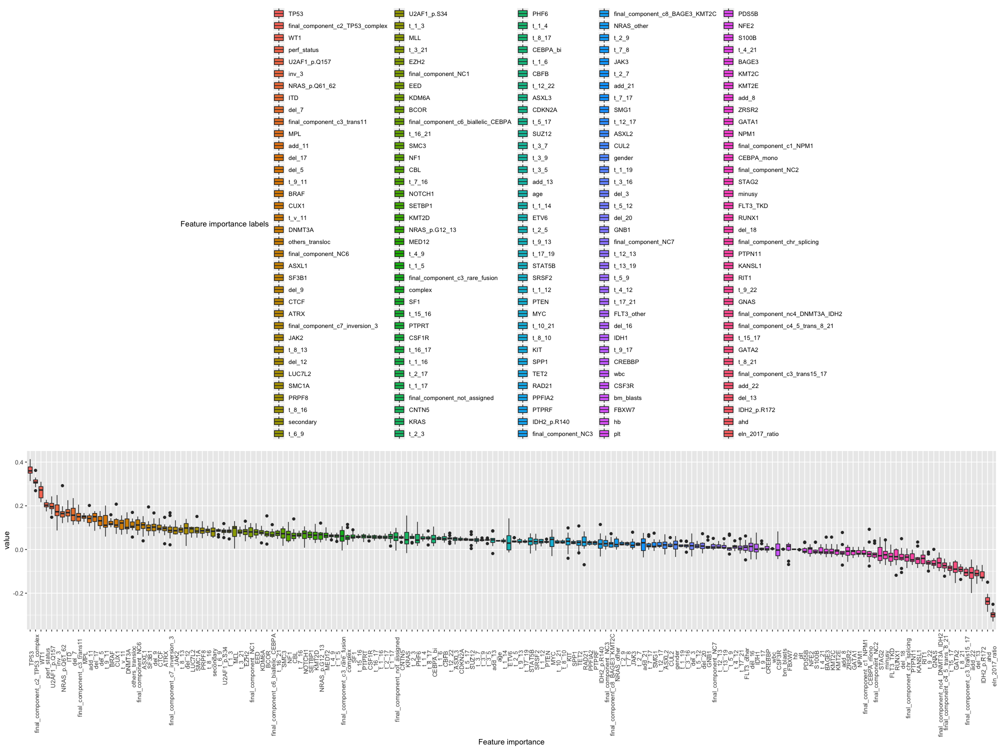

In [28]:
# Chose features you want with design
design=x[,all_features]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   #cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1500, importance="TRUE",nodesize=15)
                   cvfit<-CoxRFX(data.frame(vTrain),Surv(time=lTrain[,1],event =lTrain[,2]) , max.iter =50,tol=1e-3)
                   cvfit$Z <- NULL
                   # Predict
                   risk.predict<-predict(cvfit,data.frame(vTest))
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   return(list(as.matrix(coef(cvfit)),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=25
               )
### rescv returns a list with 25 dataframes with the coefficient of each variables for the model cross validated fitted model and 25 concordance indices on the testings set used . We do the boxplots of the variable
### importance to have an exhaustive view over the same algorithm trained differently.
rfx_results <- rescv[[1]][[1]]
colnames(rfx_results)[1] <- "exp_1"
for (i in 2:length(rescv)){
    rfx_results <-cbind(rfx_results,rescv[[i]][[1]])
    colnames(rfx_results)[i] <- paste("exp",i,sep="_")
}
rfx_results <-as.data.frame(rfx_results)
rfx_results$median <- apply(rfx_results,1, median, na.rm = TRUE)
rfx_results$features <-rownames(rfx_results)
rfx_results <- rfx_results[apply(rfx_results[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0 & apply(rfx_results[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0,]
rfx_results <-melt(rfx_results,id='features')
colnames(rfx_results) <- c('features','exp','value')
set_notebook_plot_size(20,15)
ggplot(rfx_results,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")

[1] "start CV"


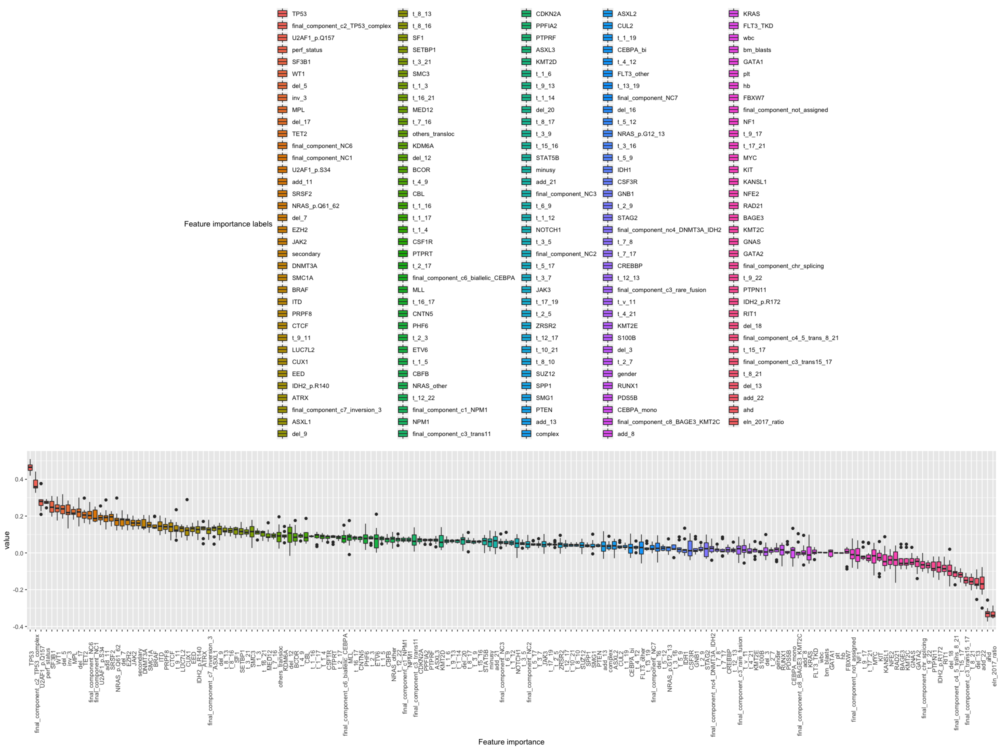

In [29]:
# RFX NO AGE
design=x[,all_features_without_age]
# Parallel CV
print("start CV")
rescv = mclapply(seq(nexp),
               FUN=function(iexp) {
                   set.seed(17)
                   cat(".")
                   vTrain = design[-folds[[iexp]],,drop=F]
                   vTest = design[folds[[iexp]],,drop=F]
                   lTrain = response[-folds[[iexp]],]
                   lTest = response[folds[[iexp]],]
                   # Train and Predict
                   #cvfit = cv.glmnet(vTrain, lTrain, family="cox", alpha=0.1, nfolds=10, grouped=TRUE)
                   #cvfit = rfsrc(Surv(time, status) ~ ., data=data.frame(vTrain,lTrain), ntree=1500, importance="TRUE",nodesize=15)
                   cvfit<-CoxRFX(data.frame(vTrain),Surv(time=lTrain[,1],event =lTrain[,2]) , max.iter =50,tol=1e-3)
                   cvfit$Z <- NULL
                   # Predict
                   risk.predict<-predict(cvfit,data.frame(vTest))
                   ci.test = suppressWarnings(survConcordance(Surv(time,status) ~ risk.predict, as.data.frame(lTest)))
                   return(list(as.matrix(coef(cvfit)),as.vector(ci.test$concordance)))  ## return a list with dataframe for variable importance and concordance index of the exp
               },
               mc.cores=25
               )
rfx_results_no_age <- rescv[[1]][[1]]
colnames(rfx_results_no_age)[1] <- "exp_1"
for (i in 2:length(rescv)){
    rfx_results_no_age <-cbind(rfx_results_no_age,rescv[[i]][[1]])
    colnames(rfx_results_no_age)[i] <- paste("exp",i,sep="_")
}
rfx_results_no_age <-as.data.frame(rfx_results_no_age)
rfx_results_no_age$median <- apply(rfx_results_no_age,1, median, na.rm = TRUE)
rfx_results_no_age$features <-rownames(rfx_results_no_age)
rfx_results_no_age <- rfx_results_no_age[apply(rfx_results_no_age[,1:nfolds*nrepeats],1, median, na.rm = TRUE)!=0 & apply(rfx_results_no_age[,1:nfolds*nrepeats],1, mean, na.rm = TRUE)!=0,]
rfx_results_no_age <-melt(rfx_results_no_age,id='features')
colnames(rfx_results_no_age) <- c('features','exp','value')
set_notebook_plot_size(20,15)
ggplot(rfx_results_no_age,aes(x=reorder(features,-value),y=value)) +
    geom_boxplot(aes(fill = reorder(features,-value)), notch=F)+
    theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+xlab("Feature importance")+labs(fill = " Feature importance labels")